## The data grabbed from QFH antenna

The Parallella (Pcko) grabbing unit was used to capture triggered data from QFH antenna and SLAVIA. Trigger was generated by AMS sensor (Divisek).

The car with antenna mounted on the roof were parked near to Kozmin. Car position 50.2462469N, 14.3667303E 


In [3]:
import os
from readrec import *
import matplotlib

sps = 10e6 # 10 Msps
path = "/storage/experiments/2019/08_29_carB_Kozomin/P_antennas"
files = ["rec_190829-140052.49","rec_190829-140142.26","rec_190829-140254.19","rec_190829-140712.16","rec_190829-141045.23"]

for fn in files:
    with open(os.path.join(path, fn), 'rb') as f:
        try:
            h, samples, synclog = loadrec(f, skipsamples=True)
        except Exception as e:
            print(fn, e)
            continue


In [4]:
def wf_plotrec(samples, sample_rate, freq_offset=0, freq_lim=None, bins=8192, ax=None, title=None,
       offset=0):
    img = waterfallize(samples, bins).T
    img[np.isneginf(img)] = np.nan
    # ^^ might not be needed, was copied from pysdr-recviewer
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(24, 6))
    if title is not None:
        fig.suptitle(title)

    ax.imshow(img, extent=[offset, offset+len(samples), freq_offset + sample_rate/2, freq_offset - sample_rate/2],
             aspect='auto', interpolation='none', cmap='jet')
    #ax.set_xlabel('Time [s]'); 
    ax.set_ylabel('Frequency [Hz]');
    
    if freq_lim is not None:
        ax.set_ylim(freq_lim[0] + freq_offset, freq_lim[1] + freq_offset)

    return ax


def plotrec(h, samples, synclog, fn, pre_trigger_blocks=10, post_trigger_blocks=5, title=None,
            marktimes=[]):
    t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)
    
    if pre_trigger_blocks > h['preTrigger']:
        pre_trigger_blocks = h['preTrigger']
    if post_trigger_blocks > h['postTrigger']:
        post_trigger_blocks = h['postTrigger']
    
    a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
    b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 
    
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(figsize=(28, 28), nrows=5, sharex=True)
    if title is not None:
        fig.suptitle(title)
        
    ax1.xaxis.set_major_locator(ticker)
    ax1.xaxis.set_major_formatter(formatter)

    ax1.plot(range(a, b), samples[a:b,3], linestyle="", marker="o", markersize=1)
    ax1.set_title("Channels 3 - Trigger")

    ax2.plot(range(a, b), samples[a:b,4:6], linestyle="", marker="o", markersize=1)
    ax2.set_title("Channels 4 and 5 - QFH ~430 MHz")
    wf_plotrec(samples[a:b,4] + 1j*samples[a:b,5], 10e6, bins=8192, ax=ax3, offset=a)
    
    ax4.plot(range(a, b), samples[a:b,7], linestyle="", marker="o", markersize=1)
    ax4.set_title("Channel 7 - SLAVIA")
    wf_plotrec(samples[a:b,7], 10e6, bins=8192, ax=ax5, freq_lim =[0,10e6/2], offset=a)
    
    at, bt = s2t(a), s2t(b)
    for t in marktimes:
        if t > at and t < bt:
            for ax in [ax1, ax2, ax3, ax4, ax5]:
                ax.axvline(x=t2s(t), color='purple', ls='--') 


## Plotting of the data

* Channels 3 is connected to Trigger pulses. 
* Channels 4 and 5 were connected to the QFH antenna.
* Channel 7 is SLAVIA output


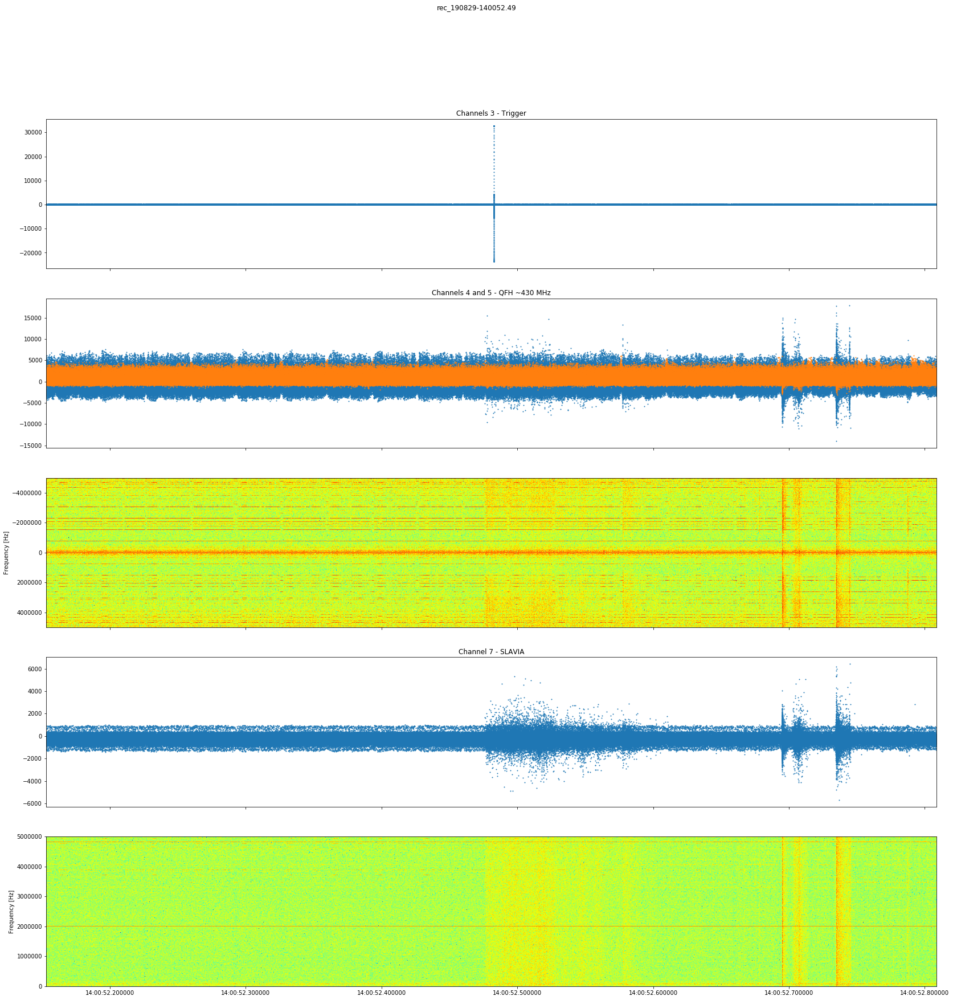

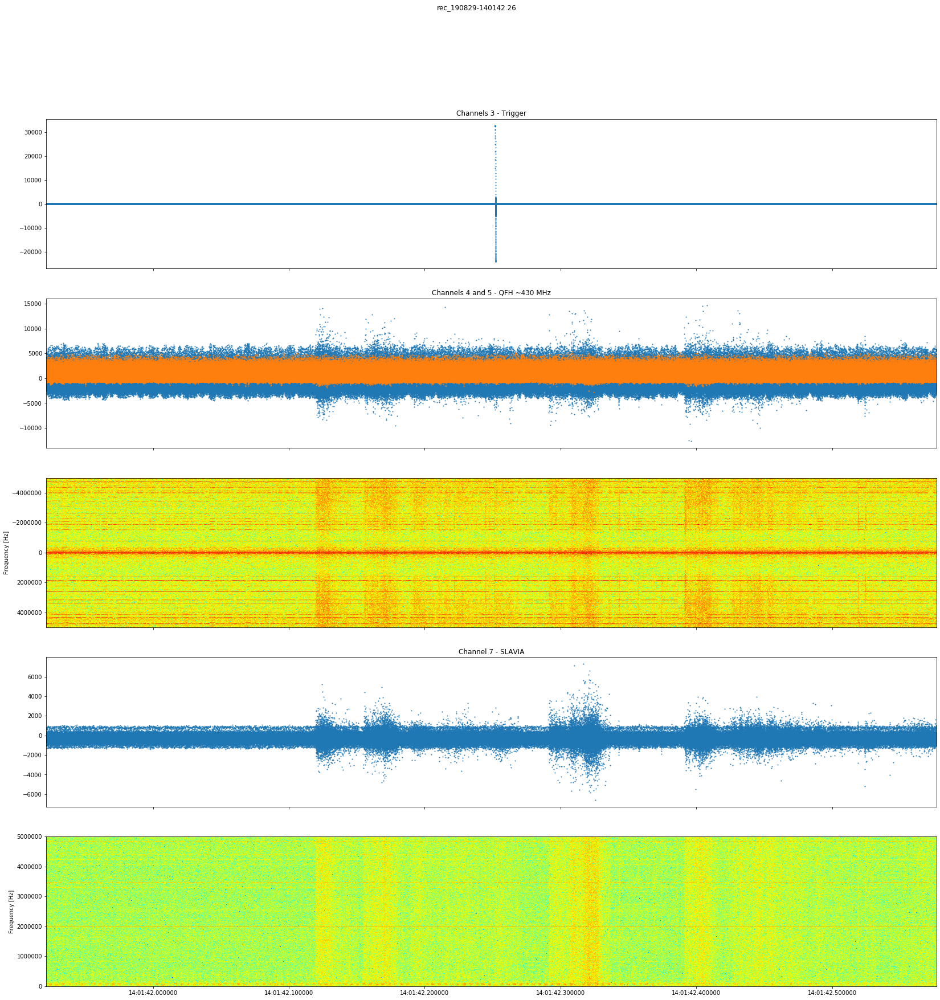

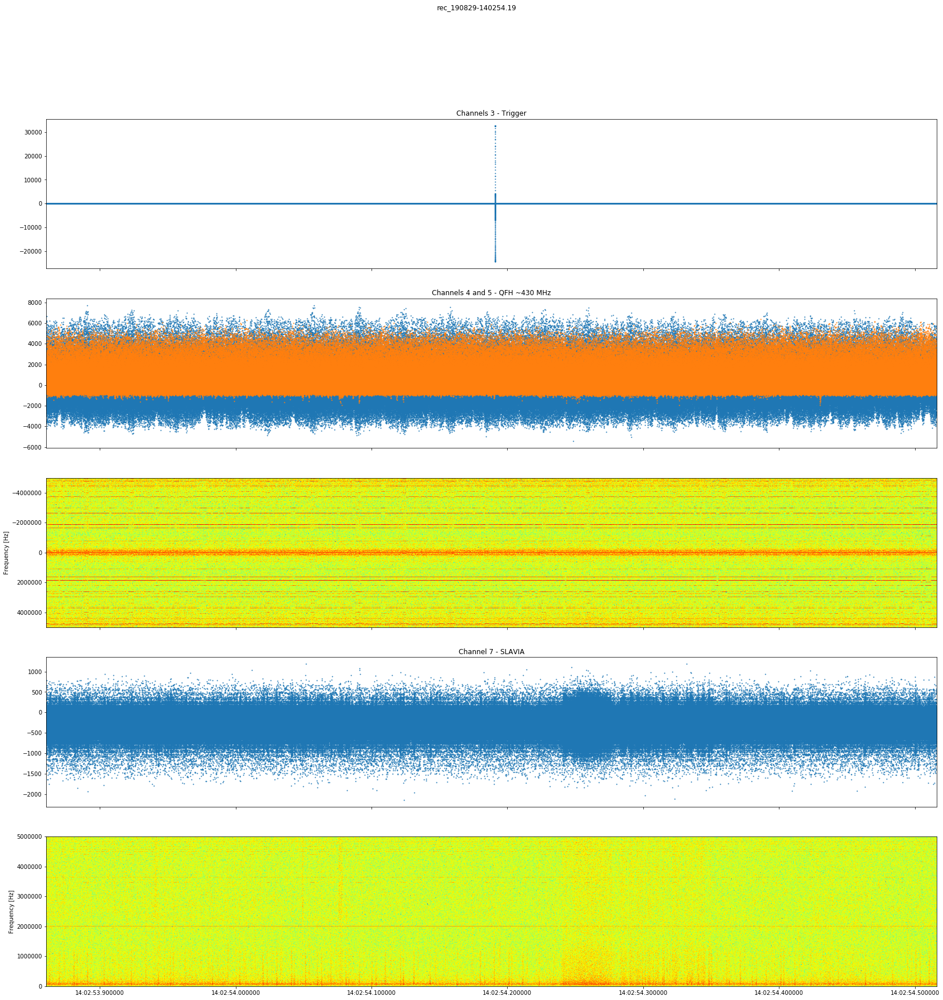

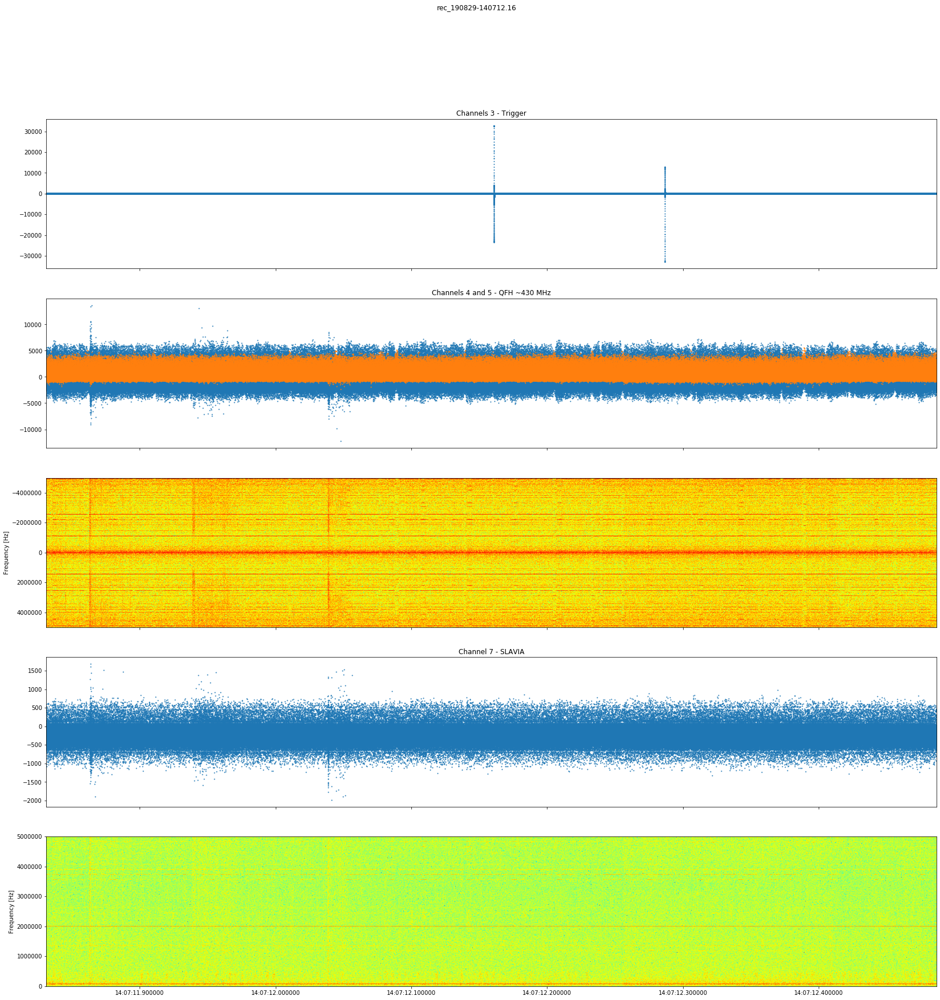

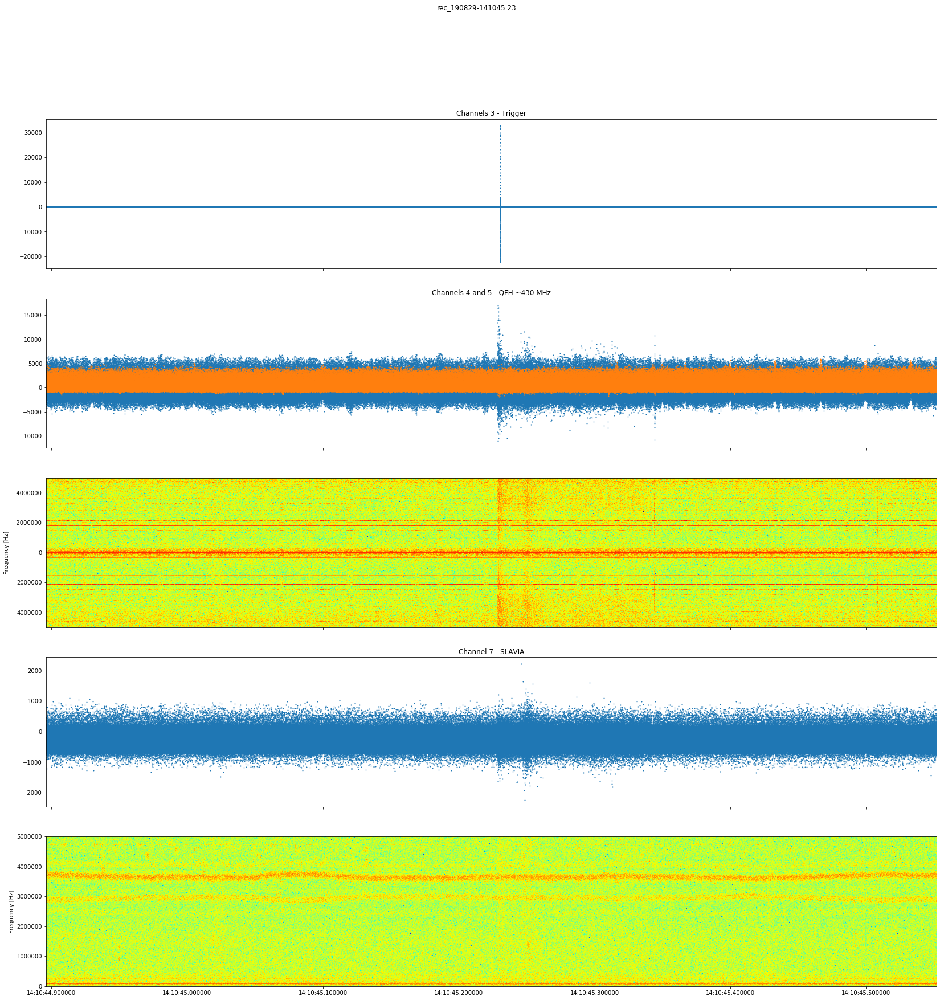

In [5]:
import os
pre_trigger_blocks = 50
post_trigger_blocks = 50


for fn in files:
    with open(os.path.join(path, fn), 'rb') as f:
        try:
            h, samples, synclog = loadrec(f)
            fig = plotrec(h, samples, synclog, os.path.basename(fn),
                    title=os.path.basename(fn),
                    pre_trigger_blocks = pre_trigger_blocks,
                    post_trigger_blocks = post_trigger_blocks,
                    #marktimes=marktimes
                    )
            #fig.savefig(os.path.basename(fn) + '.png', bbox_inches='tight')
            #fig.clear()
            #plt.close(fig)
            
        except Exception as e:
            print(e)

In [10]:
import os
import numpy
pre_trigger_blocks = 50
post_trigger_blocks = 50


for fn in files:
    with open(os.path.join(path, fn), 'rb') as f:
        try:
            h, samples, synclog = loadrec(f)
            data = numpy.asarray([samples[:,3], np.abs(samples[:,4] + 1j*samples[:,5]), samples[:,7]])
            data = np.transpose(data)
            numpy.savetxt(os.path.basename(fn)+".csv", data, delimiter=",",header = "Timestamp, Trigger, QFH, SLAVIA")
            
        except Exception as e:
            print(e)

In [11]:
with open(os.path.join(path, files[0]), 'rb') as f:
        h, samples, synclog = loadrec(f)

In [12]:
assign_time_axis(files[0], h, synclog)

(<function readrec.assign_time_axis.<locals>.<lambda>(t)>,
 <function readrec.assign_time_axis.<locals>.<lambda>(s)>,
 <matplotlib.ticker.FuncFormatter at 0x7f3a27f7b510>)

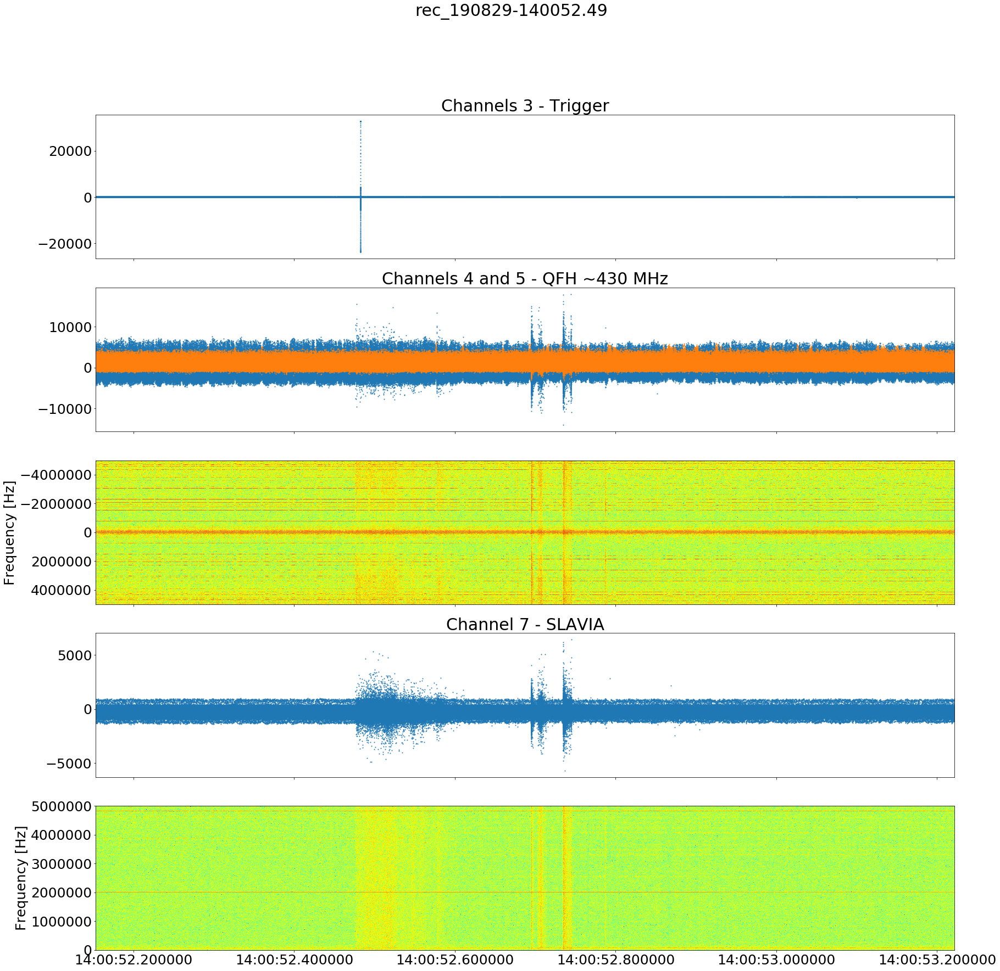

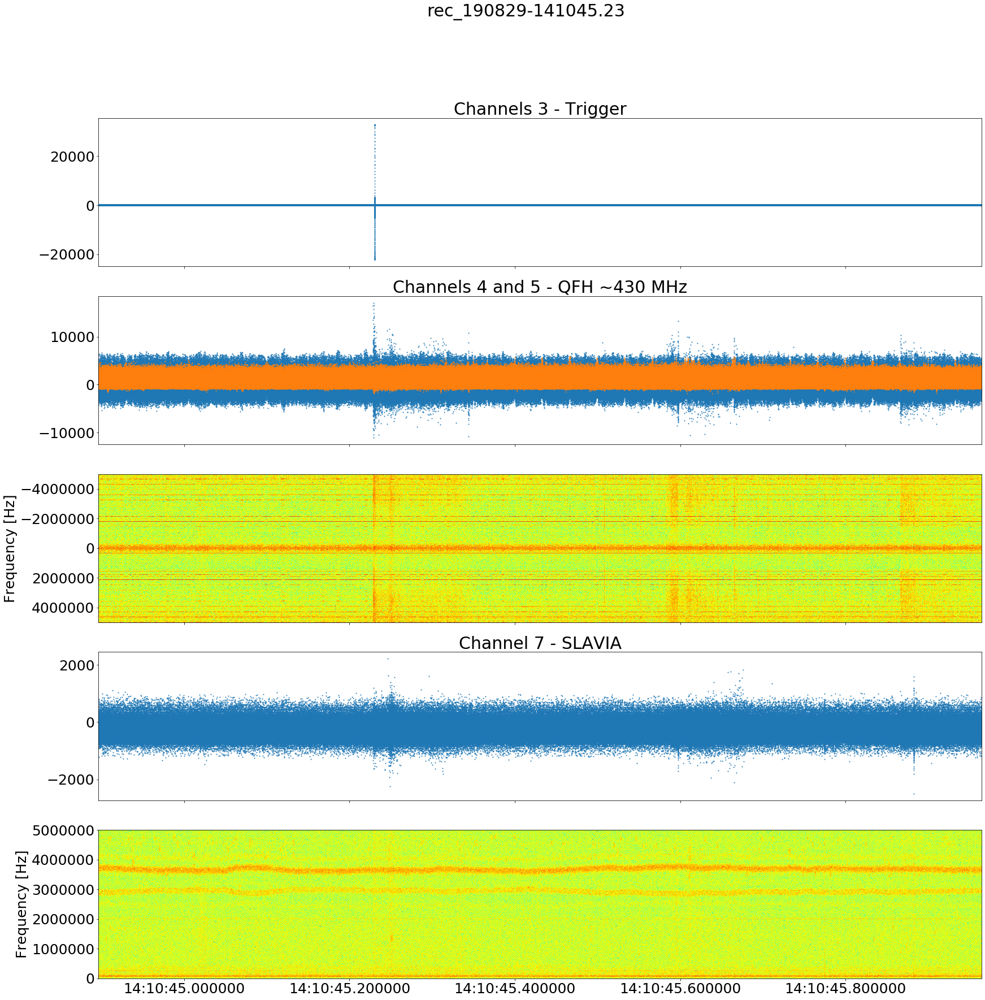

In [13]:
import os
pre_trigger_blocks = 50
post_trigger_blocks = 500

matplotlib.rcParams.update({'font.size':25})

files = ["rec_190829-140052.49","rec_190829-141045.23"]

for fn in files:
    with open(os.path.join(path, fn), 'rb') as f:
        try:
            h, samples, synclog = loadrec(f)
            fig = plotrec(h, samples, synclog, os.path.basename(fn),
                    title=os.path.basename(fn),
                    pre_trigger_blocks = pre_trigger_blocks,
                    post_trigger_blocks = post_trigger_blocks,
                    #marktimes=marktimes
                    )
            #fig.savefig(os.path.basename(fn) + '.png', bbox_inches='tight')
            #fig.clear()
            #plt.close(fig)
            
        except Exception as e:
            print(e)